# Toronto Dwellings Analysis

In this assignment, you will perform fundamental analysis for the Toronto dwellings market to allow potential real estate investors to choose rental investment properties.

In [1]:
# imports
import panel as pn
pn.extension('plotly')
import plotly.express as px
import pandas as pd
import hvplot.pandas
import matplotlib.pyplot as plt
import os
from pathlib import Path
from dotenv import load_dotenv
from panel.interact import interact

In [2]:
# Read the Mapbox API key
load_dotenv()
map_box_api = os.getenv("mapbox")

## Load Data

In [3]:
# Read the census data into a Pandas DataFrame
file_path = Path("Data/toronto_neighbourhoods_census_data.csv")
to_data = pd.read_csv(file_path, index_col="year")
to_data.head()

,neighbourhood,single_detached_house,apartment_five_storeys_plus,movable_dwelling,semi_detached_house,row_house,duplex,apartment_five_storeys_less,other_house,average_house_value,shelter_costs_owned,shelter_costs_rented
year,,,,,,,,,,,,
2001,Agincourt North,3715,1480,0,1055,1295,195,185,5,200388,810,870
2001,Agincourt South-Malvern West,3250,1835,0,545,455,105,425,0,203047,806,892
2001,Alderwood,3175,315,0,470,50,185,370,0,259998,817,924
2001,Annex,1060,6090,5,1980,605,275,3710,165,453850,1027,1378
2001,Banbury-Don Mills,3615,4465,0,240,380,15,1360,0,371864,1007,1163


- - - 

## Dwelling Types Per Year

In this section, you will calculate the number of dwelling types per year. Visualize the results using bar charts and the Pandas plot function. 

**Hint:** Use the Pandas `groupby` function.

**Optional challenge:** Plot each bar chart in a different color.

In [4]:
# Calculate the sum number of dwelling types units per year (hint: use groupby)
dwelling_year= to_data.groupby(['year']).sum()
dwelling_year= dwelling_year.drop(columns=["average_house_value","shelter_costs_owned", "shelter_costs_rented"])


In [5]:
# Save the dataframe as a csv file
dwelling_year.to_csv(r'dwelling_types_year_data.csv', index = True, header=True)


In [6]:
# Helper create_bar_chart function
def create_bar_chart(data, year, color):
    dwelling_year_chart = data.loc[year].hvplot.bar(
        title = "Dwelling types in Toronto " + str(year),
        xlabel="Dwelling types "+ str(year), 
        ylabel= "Dwelling types units",
        yformatter='%0f',
        rot=90,
        height=500,
        color = color
    )
    bar_chart = pn.panel(dwelling_year_chart)
    return bar_chart
     # # Bar chart for 2001
# create_bar_chart(df_dwelling_units.loc[2001], "Dwelling Types in Toronto in 2001", "2001", "Dwelling Type Units", "red")

In [7]:
# Bar chart by using panda plot fn 
#dwelling_year.loc[2001].plot(kind="bar")

In [8]:
# Create a bar chart per year to show the number of dwelling types
# Bar chart for 2001
create_bar_chart(data=dwelling_year, year = 2001, color = "orange")

HoloViews(Bars)

In [9]:
# Bar chart for 2006
create_bar_chart(dwelling_year, year = 2006, color = "pink")

HoloViews(Bars)

In [10]:
# Bar chart for 2011
create_bar_chart(dwelling_year,year = 2011, color = "red")


HoloViews(Bars)

In [11]:
# Bar chart for 2016
create_bar_chart(dwelling_year, year = 2016, color = "blue")

HoloViews(Bars)

- - - 

## Average Monthly Shelter Costs in Toronto Per Year

In this section, you will calculate the average monthly shelter costs for owned and rented dwellings and the average house value for each year. Plot the results as a line chart.

**Optional challenge:** Plot each line chart in a different color.

In [12]:
# Calculate the average monthly shelter costs for owned and rented dwellings
monthly_shelter_costs= to_data[["shelter_costs_owned",  "shelter_costs_rented"]].groupby("year").mean()
monthly_shelter_costs

,shelter_costs_owned,shelter_costs_rented
year,,
2001,846.878571,1085.935714
2006,1316.800000,925.414286
2011,1448.214286,1019.792857
2016,1761.314286,1256.321429


In [13]:
# Helper create_line_chart function
def create_line_chart(data, type, color):
    monthly_shelter_costs_chart = data[type].hvplot.line(
        title = "Avg Monthly Shelter Cost for "  +"in Toronto",
        xlabel="Year", 
        ylabel= "Avg Monthly Shelter Cost",
        yformatter='%0f',
        rot=90,
        width=800,
        color= color)
    line_chart = pn.panel(monthly_shelter_costs_chart)
    return line_chart

In [14]:
# Create two line charts, one to plot the monthly shelter costs for owned dwelleing and other for rented dwellings per year
# Line chart for owned dwellings
create_line_chart(data = monthly_shelter_costs, type = "shelter_costs_owned", color = "blue")

HoloViews(Curve)

In [15]:
# Line chart for rented dwellings
create_line_chart(data = monthly_shelter_costs, type = "shelter_costs_rented", color = "orange")

HoloViews(Curve)

## Average House Value per Year

In this section, you want to determine the average house value per year. An investor may want to understand better the sales price of the rental property over time. For example, a customer will want to know if they should expect an increase or decrease in the property value over time so they can determine how long to hold the rental property. You will visualize the `average_house_value` per year as a bar chart.

In [16]:
# Calculate the average house value per year
average_house_value = to_data["average_house_value"].groupby("year").mean()
average_house_value

year
2001    289882.885714
2006    424059.664286
2011    530424.721429
2016    664068.328571
Name: average_house_value, dtype: float64

In [17]:
# Plot the average house value per year as a line chart
average_house_value.hvplot.line(        
        title ="Average house value in Toronto",
        xlabel="Year", 
        ylabel= "Average house value",
        yformatter='%0f',
        width=800,
        color= "blue")

:Curve   [year]   (average_house_value)

- - - 

## Average House Value by Neighbourhood

In this section, you will use `hvplot` to create an interactive visualization of the average house value with a dropdown selector for the neighbourhood.

**Hint:** It will be easier to create a new DataFrame from grouping the data and calculating the mean house values for each year and neighbourhood.

In [18]:
# Create a new DataFrame with the mean house values by neighbourhood per year
neighbourhood_data = to_data.groupby(['year','neighbourhood', 'average_house_value']).mean().reset_index()
neighbourhood_data = neighbourhood_data[['year','neighbourhood', 'average_house_value']]
neighbourhood_data.head()

,year,neighbourhood,average_house_value
0,2001,Agincourt North,200388
1,2001,Agincourt South-Malvern West,203047
2,2001,Alderwood,259998
3,2001,Annex,453850
4,2001,Banbury-Don Mills,371864


In [19]:
# The plot should have a dropdown selector for the neighbourhood

# Declare one list of neighbourhood to be used in a Panel select list
list_of_neighbourhood = neighbourhood_data["neighbourhood"].sort_values().drop_duplicates().values.tolist()

# Define function to choose a neighborhood
def choose_neighbourhood(neighbourhood):
    choose_neighbourhood_data=neighbourhood_data.loc[neighbourhood_data["neighbourhood"] ==  neighbourhood]
    choose_neighbourhood_data= choose_neighbourhood_data.set_index('year')
    
    return choose_neighbourhood_data.hvplot(
        
        title ="Average house value in "+ neighbourhood,
        xlabel="Year", 
        ylabel= "average_house_value",
        yformatter='%0f',
        width=800,)
 

In [20]:
# Testing fn choose_neighbourhood
#choose_neighbourhood("Agincourt North") 

In [21]:
# Call the choose_neighbourhood function and return plot with interactivity
interact(choose_neighbourhood, neighbourhood=list_of_neighbourhood)

Column
    [0] Column
        [0] Select(name='neighbourhood', options=['Agincourt North', ...], value='Agincourt North')
    [1] Row
        [0] HoloViews(Curve, name='interactive02558')

## Number of Dwelling Types per Year

In this section, you will use `hvplot` to create an interactive visualization of the average number of dwelling types per year with a dropdown selector for the neighbourhood.

In [22]:
# Fetch the data of all dwelling types per year
all_data=to_data.groupby(['year','neighbourhood']).sum().reset_index()

all_data= all_data.drop(columns=["average_house_value", "shelter_costs_owned", "shelter_costs_rented"])
all_data.head()

,year,neighbourhood,single_detached_house,apartment_five_storeys_plus,movable_dwelling,semi_detached_house,row_house,duplex,apartment_five_storeys_less,other_house
0,2001,Agincourt North,3715,1480,0,1055,1295,195,185,5
1,2001,Agincourt South-Malvern West,3250,1835,0,545,455,105,425,0
2,2001,Alderwood,3175,315,0,470,50,185,370,0
3,2001,Annex,1060,6090,5,1980,605,275,3710,165
4,2001,Banbury-Don Mills,3615,4465,0,240,380,15,1360,0


In [23]:
# Use hvplot to create an interactive bar chart of the number of dwelling types per neighbourhood
# The plot should have a dropdown selector for the neighbourhood

def choose_dwellingtype_neighbourhood(neighbourhood):
    choose_dwellingtype_neighbourhood_data=all_data.loc[all_data["neighbourhood"] ==  neighbourhood]
    choose_dwellingtype_neighbourhood_data= choose_dwellingtype_neighbourhood_data.set_index('year')
    
    return choose_dwellingtype_neighbourhood_data.hvplot.bar(
        title ="Number of dwelling types per year in " + neighbourhood,
        xlabel="Year", 
        ylabel= "Dwelling types unit",
        height=500,
        yformatter='%0f',
        rot = 90,
        )
 


- - - 

In [24]:
# Testing fn choose_dwellingtype_neighbourhood
#choose_dwellingtype_neighbourhood ("Agincourt North") 

In [25]:
# Call the choose_neighbourhood function and return plot with interactivity
interact(choose_dwellingtype_neighbourhood, neighbourhood=list_of_neighbourhood)

Column
    [0] Column
        [0] Select(name='neighbourhood', options=['Agincourt North', ...], value='Agincourt North')
    [1] Row
        [0] HoloViews(Bars, name='interactive02740')

## The Top 10 Most Expensive Neighbourhoods

In this section, you will need to calculate the house value for each neighbourhood and then sort the values to obtain the top 10 most expensive neighbourhoods on average. Plot the results as a bar chart.

In [26]:
# Getting the data from the top 10 expensive neighbourhoods
# Slice data and display
to_data[["neighbourhood","average_house_value"]]
# Group data based on neighbourhood, calculate the mean of average_house_value
expensive_neighbourhoods= to_data[["neighbourhood","average_house_value"]].groupby(["neighbourhood"]).mean()
expensive_neighbourhoods= expensive_neighbourhoods.nlargest(10, columns=["average_house_value"]).copy()
expensive_neighbourhoods

,average_house_value
neighbourhood,
Bridle Path-Sunnybrook-York Mills,1526485.75
Forest Hill South,1195992.50
Lawrence Park South,1094027.75
Rosedale-Moore Park,1093640.00
St.Andrew-Windfields,999107.00
Casa Loma,981064.25
Bedford Park-Nortown,930415.25
Forest Hill North,851680.50
Kingsway South,843234.25


In [27]:
# Plotting the data from the top 10 expensive neighbourhoods
expensive_neighbourhoods.hvplot.bar(        
        title ="Top 10 Most Expensive Neighbourhoods in Toronto",
        xlabel="Neighbourhoods", 
        ylabel= "Average house value",
        yformatter='%0f',
        height=500,
        rot = 90,)

:Bars   [neighbourhood]   (average_house_value)

- - - 

## Neighbourhood Map

In this section, you will read in neighbourhoods location data and build an interactive map with the average house value per neighbourhood. Use a `scatter_mapbox` from Plotly express to create the visualization. Remember, you will need your Mapbox API key for this.

### Load Location Data

In [28]:
# Load neighbourhoods coordinates data
file_path = Path("Data/toronto_neighbourhoods_coordinates.csv")
df_neighbourhood_locations = pd.read_csv(file_path)
df_neighbourhood_locations

,neighbourhood,lat,lon
0,Agincourt North,43.805441,-79.266712
1,Agincourt South-Malvern West,43.788658,-79.265612
2,Alderwood,43.604937,-79.541611
3,Annex,43.671585,-79.404001
4,Banbury-Don Mills,43.737657,-79.349718
...,...,...,...
135,Wychwood,43.676919,-79.425515
136,Yonge-Eglinton,43.704689,-79.403590
137,Yonge-St.Clair,43.687859,-79.397871
138,York University Heights,43.765736,-79.488883


### Data Preparation

You will need to join the location data with the mean values per neighbourhood.

1. Calculate the mean values for each neighbourhood.

2. Join the average values with the neighbourhood locations.

In [29]:
# Calculate the mean values for each neighborhood
mean_neighbourhoods= to_data[["neighbourhood","average_house_value"]].groupby(["neighbourhood"]).mean().reset_index()
mean_neighbourhoods.head()

,neighbourhood,average_house_value
0,Agincourt North,329811.5
1,Agincourt South-Malvern West,334189.0
2,Alderwood,427922.5
3,Annex,746977.0
4,Banbury-Don Mills,612039.0


In [30]:
# Join the average values with the neighbourhood locations
location_value_neighbourhood=pd.concat(
    [df_neighbourhood_locations,mean_neighbourhoods], axis="columns", join="inner")
location_value_neighbourhood
# Drop duplicate columns
location_value_neighbourhood= location_value_neighbourhood.loc[:,~location_value_neighbourhood.columns.duplicated(keep='last')]


### Mapbox Visualization

Plot the average values per neighbourhood using a Plotly express `scatter_mapbox` visualization.

In [31]:
# Set the Mapbox API
px.set_mapbox_access_token(map_box_api)


- - -

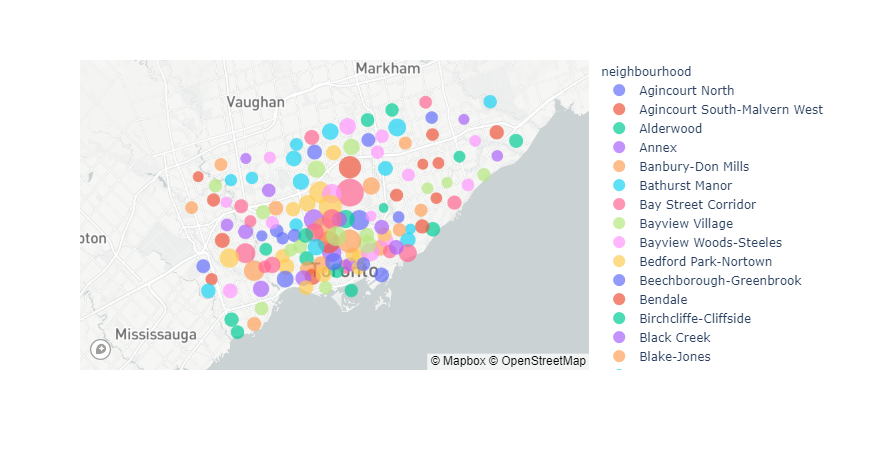

In [32]:
# Create a scatter mapbox to analyze neighbourhood info
# Plot Data
map = px.scatter_mapbox(
    location_value_neighbourhood,
    lat="lat",
    lon="lon",
    size="average_house_value",
    color="neighbourhood",
    zoom=9
)

# Display the map
map.show()

## Cost Analysis - Optional Challenge

In this section, you will use Plotly express to a couple of plots that investors can interactively filter and explore various factors related to the house value of the Toronto's neighbourhoods. 

### Create a bar chart row facet to plot the average house values for all Toronto's neighbourhoods per year

In [33]:
# Prep data
cost_data = pd.DataFrame(to_data
                .groupby(['year','neighbourhood'])
                .sum()['average_house_value']
                )
cost_data= cost_data.reset_index()
cost_data

,year,neighbourhood,average_house_value
0,2001,Agincourt North,200388
1,2001,Agincourt South-Malvern West,203047
2,2001,Alderwood,259998
3,2001,Annex,453850
4,2001,Banbury-Don Mills,371864
...,...,...,...
555,2016,Wychwood,787760
556,2016,Yonge-Eglinton,1127052
557,2016,Yonge-St.Clair,1131888
558,2016,York University Heights,425769


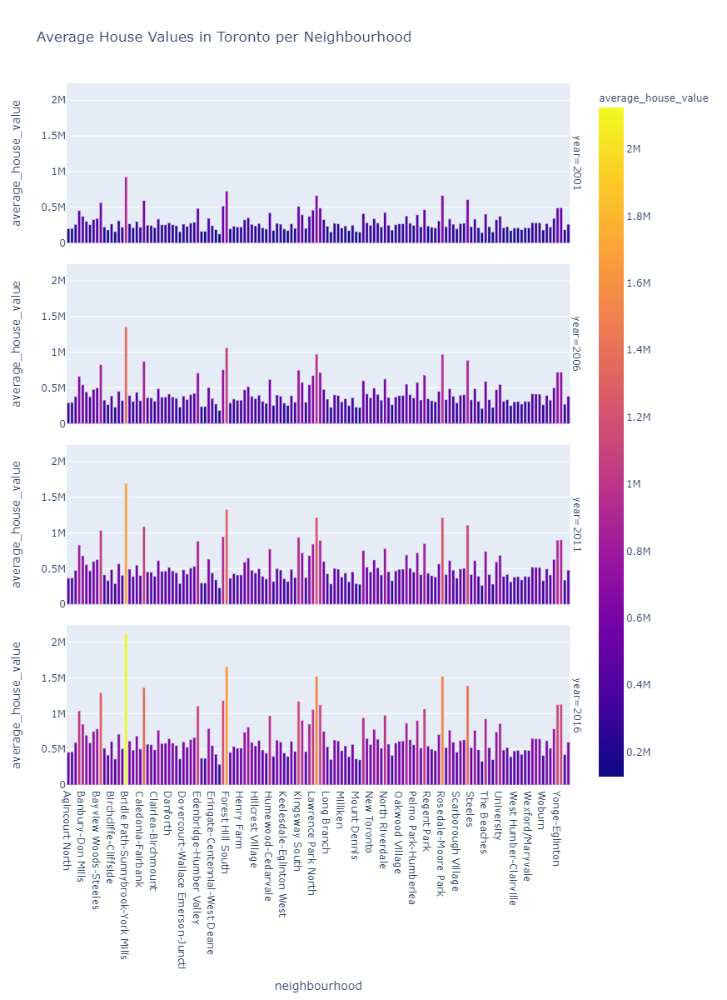

In [34]:
# YOUR CODE HERE!
fig = px.bar(cost_data, x="neighbourhood", 
             y='average_house_value',
             color='average_house_value', 
             facet_row="year",
             height=1200,
             width=800,
             title='Average House Values in Toronto per Neighbourhood'
            )
fig.show()

### Create a sunburst chart to conduct a costs analysis of most expensive neighbourhoods in Toronto per year

In [35]:
# Fetch the data from all expensive neighbourhoods per year.

expensive_neighbours = expensive_neighbourhoods.reset_index()['neighbourhood'].tolist()
expensive_neighbours


['Bridle Path-Sunnybrook-York Mills',
 'Forest Hill South',
 'Lawrence Park South',
 'Rosedale-Moore Park',
 'St.Andrew-Windfields',
 'Casa Loma',
 'Bedford Park-Nortown',
 'Forest Hill North',
 'Kingsway South',
 'Yonge-St.Clair']

In [39]:
sunburst_data = (to_data.loc[
    to_data['neighbourhood'].isin(expensive_neighbours)
                              ])

sunburst_data=sunburst_data.reset_index()

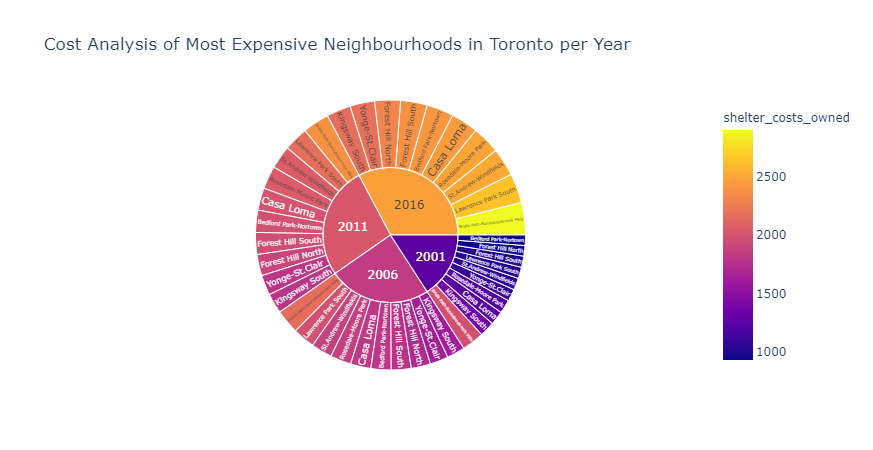

In [47]:
# Create the sunburst chart
sunburst_data_fig = px.sunburst(sunburst_data,
           path=["year","neighbourhood"],
           values="shelter_costs_owned",
            color="shelter_costs_owned",
                      title="Cost Analysis of Most Expensive Neighbourhoods in Toronto per Year",
                                hover_data=["average_house_value", "shelter_costs_rented" ]
                      
           )
sunburst_data_fig.show()